# **Capstone Project**
Prathamesh Jawale

## License Plate Detection and Recognition

# Creating the input pipeline

Importing the necessary libraries

In [ ]:
# Import necessary libraries
import os

# Mount your Google Drive (You'll be prompted to authorize access)
from google.colab import drive
drive.mount('/content/drive')

# List files in a directory in your Google Drive
directory_path = '/content/drive/My Drive/voc_plate_dataset'

for root, dirs, files in os.walk(directory_path):
    for filename in files:
        print(os.path.join(root, filename))


Streaming output truncated to the last 5000 lines.
/content/drive/My Drive/voc_plate_dataset/train/labels/CarLongPlateGen1666.txt
/content/drive/My Drive/voc_plate_dataset/train/labels/CarLongPlateGen1092.txt
/content/drive/My Drive/voc_plate_dataset/train/labels/CarLongPlateGen127.txt
/content/drive/My Drive/voc_plate_dataset/train/labels/CarLongPlate897.txt
/content/drive/My Drive/voc_plate_dataset/train/labels/CarLongPlateGen1086.txt
/content/drive/My Drive/voc_plate_dataset/train/labels/CarLongPlateGen250.txt
/content/drive/My Drive/voc_plate_dataset/train/labels/CarLongPlate978.txt
/content/drive/My Drive/voc_plate_dataset/train/labels/CarLongPlate512.txt
/content/drive/My Drive/voc_plate_dataset/train/labels/CarLongPlateGen2254.txt
/content/drive/My Drive/voc_plate_dataset/train/labels/CarLongPlateGen223.txt
/content/drive/My Drive/voc_plate_dataset/train/labels/CarLongPlateGen1305.txt
/content/drive/My Drive/voc_plate_dataset/train/labels/CarLongPlateGen1832.txt
/content/drive/M

In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

from sklearn.model_selection import train_test_split
import torch

import os
import glob

import xml.etree.cElementTree as ET

from tqdm.auto import tqdm
import shutil as sh
import warnings

warnings.filterwarnings('ignore')

Checking if GPU is available

In [ ]:
# Check if a GPU is available
print(torch.cuda.is_available())

# Get the name of the available GPU
print(torch.cuda.get_device_name(0))

True
Tesla T4


Setting Up the paths for annotations ans respective jped images

In [ ]:
ANNOTATIONS_PATH = '/content/drive/My Drive/voc_plate_dataset/Annotations/'
IMAGES_PATH = '/content/drive/My Drive/voc_plate_dataset/JPEGImages/'

# Print the paths for annotations and images
print(ANNOTATIONS_PATH)  # Print the path to the annotations directory
print(IMAGES_PATH)  # Print the path to the images directory

/content/drive/My Drive/voc_plate_dataset/Annotations/
/content/drive/My Drive/voc_plate_dataset/JPEGImages/


Visualizing the VOC pascal dataset

Image shape: (303, 472, 3)


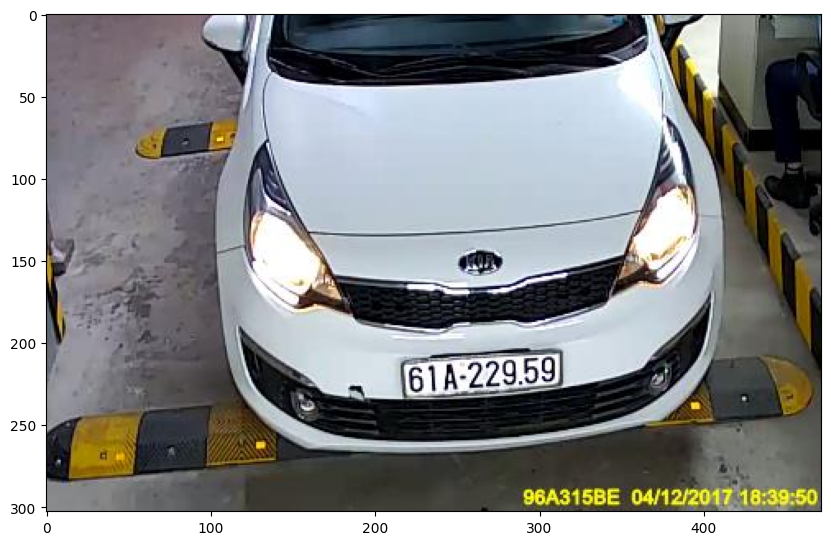

In [ ]:

# Create the full path to the image file
image_path = '/content/drive/My Drive/voc_plate_dataset/JPEGImages/CarLongPlate74.jpg'

# Read the image from the specified file
img = plt.imread(image_path)

# Create a figure and axes for displaying the image
fig, ax = plt.subplots(figsize=(10, 8))

# Display the image on the axes
ax.imshow(img)

# Print the shape of the image (dimensions)
print('Image shape: {}'.format(img.shape))


/content/drive/My Drive/voc_plate_dataset/voc_plate_dataset/Annotations/CarLongPlateGen2506.xml

In [ ]:
print(img)

[[[115 104 112]
  [115 104 112]
  [115 104 112]
  ...
  [197 228 233]
  [153 183 194]
  [ 73 105 118]]

 [[114 103 111]
  [114 103 111]
  [114 103 111]
  ...
  [ 43  72  78]
  [ 53  83  94]
  [ 41  73  86]]

 [[113 102 110]
  [113 102 110]
  [113 102 110]
  ...
  [ 33  60  67]
  [ 65  95 106]
  [ 99 128 144]]

 ...

 [[137 138 140]
  [137 138 140]
  [137 138 140]
  ...
  [105 108  89]
  [109 110 112]
  [ 87  87  99]]

 [[137 138 140]
  [137 138 140]
  [137 138 140]
  ...
  [101 105  90]
  [ 99 103 106]
  [ 93  95 107]]

 [[137 138 140]
  [137 138 140]
  [137 138 140]
  ...
  [101 110  79]
  [ 97 103 101]
  [103 107 119]]]


Reading the XML format of the dataset

In [ ]:
with open(os.path.join(ANNOTATIONS_PATH, 'CarLongPlateGen2506.xml')) as f:
    print(f.read())

<annotation>
	<folder/>
	<filename>CarLongPlateGen2506.jpg</filename>
	<path>.\data\/CarLongPlateGen2506.jpg</path>
	<source>
		<database>Unknown</database>
	</source>
	<size>
		<width>472</width>
		<height>303</height>
		<depth>3</depth>
	</size>
	<segmented>0</segmented>
	<object>
		<name>plate</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>241</xmin>
			<ymin>221</ymin>
			<xmax>357</xmax>
			<ymax>287</ymax>
		</bndbox>
	</object>
</annotation>



Defining the variables from the xml files

In [ ]:
df_dict = {
    "filename": [], "xmin": [], "ymin": [],
    "xmax": [], "ymax": [], "name": [],
    "width": [], "height": []
}

for annotation in glob.glob(ANNOTATIONS_PATH+"/*.xml"):
    tree = ET.parse(annotation)
    filename = tree.find('filename').text
    for elem in tree.iter():
        if 'size' in elem.tag:
            for attr in list(elem):
                if 'width' in attr.tag:
                    width = int(round(float(attr.text)))
                if 'height' in attr.tag:
                    height = int(round(float(attr.text)))


        if 'object' in elem.tag:
            for attr in list(elem):
                if 'name' in attr.tag:
                    name = attr.text
                    df_dict['name'] += [name]
                    df_dict['width'] += [width]
                    df_dict['height'] += [height]
                    df_dict['filename'] += [filename]

                if 'bndbox' in attr.tag:
                    for dim in list(attr):
                        if 'xmin' in dim.tag:
                            xmin = int(round(float(dim.text)))
                            df_dict['xmin'] += [xmin]
                        if 'ymin' in dim.tag:
                            ymin = int(round(float(dim.text)))
                            df_dict['ymin'] += [ymin]
                        if 'xmax' in dim.tag:
                            xmax = int(round(float(dim.text)))
                            df_dict['xmax'] += [xmax]
                        if 'ymax' in dim.tag:
                            ymax = int(round(float(dim.text)))
                            df_dict['ymax'] += [ymax]

In [ ]:
df = pd.DataFrame(df_dict)
df.head()

,filename,xmin,ymin,xmax,ymax,name,width,height
0,CarLongPlateGen1684.jpg,145,42,249,73,plate,472,303
1,CarLongPlateGen1678.jpg,156,120,265,153,plate,472,303
2,CarLongPlateGen1671.jpg,179,208,277,235,plate,472,303
3,CarLongPlateGen1686.jpg,212,171,308,198,plate,472,303
4,CarLongPlateGen1675.jpg,210,242,286,260,plate,472,303


In [ ]:
print('Data shape: {}'.format(df.shape))
print('Count of unique images: {}'.format(df['filename'].nunique()))
print('Count of classes: {}'.format(df['name'].unique()))

Data shape: (3085, 8)
Count of unique images: 3005
Count of classes: ['plate']


Creating the bounding box around the license plate

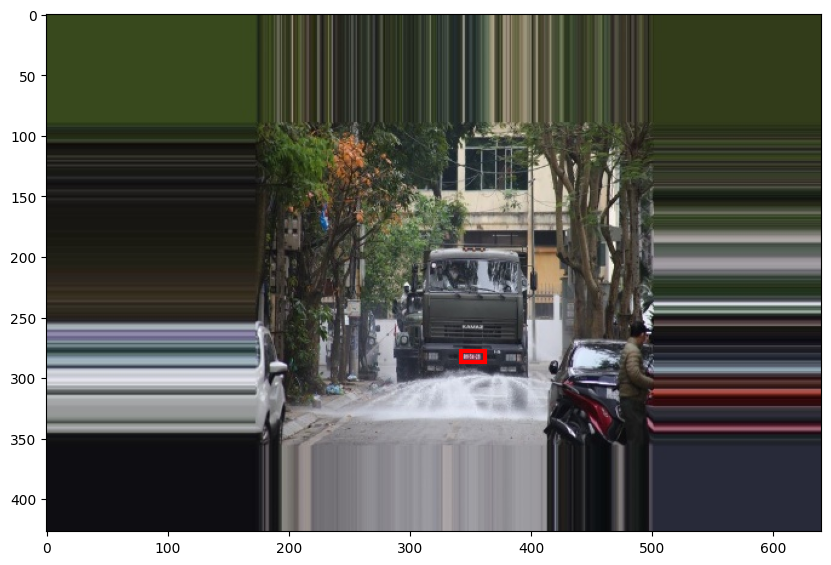

In [ ]:
# Define the filename of the image you want to process
image_filename = 'boderquandoi92.jpg'

# Create the full path to the image file
image_path = os.path.join(IMAGES_PATH, image_filename)

# Read the image from the specified file
img = plt.imread(image_path)

# Create a figure and axes for displaying the image
fig, ax = plt.subplots(figsize=(10, 8))

# Display the image on the axes
ax.imshow(img)

# Get the index of the image in a DataFrame (df) based on the filename
image_idx = df[df['filename'] == image_filename].index

# Extract information about bounding boxes
x_min = df.loc[image_idx, 'xmin'].values
y_min = df.loc[image_idx, 'ymin'].values
box_width = (df.loc[image_idx, 'xmax'] - df.loc[image_idx, 'xmin']).values
box_height = (df.loc[image_idx, 'ymax'] - df.loc[image_idx, 'ymin']).values

# Loop through all bounding boxes and draw rectangles
for i in range(len(image_idx)):
    rect = patches.Rectangle(
        (x_min[i], y_min[i]),  # Coordinates of the top-left corner
        box_width[i],  # Width of the rectangle
        box_height[i],  # Height of the rectangle
        linewidth=3,  # Line width
        edgecolor='r',  # Line color (red in this case)
        facecolor='none'  # No fill color (none)
    )
    ax.add_patch(rect)  # Add the rectangle to the image

# The code above adds red bounding boxes to the image based on the coordinates and dimensions
# extracted from a DataFrame (df) for the specified image.


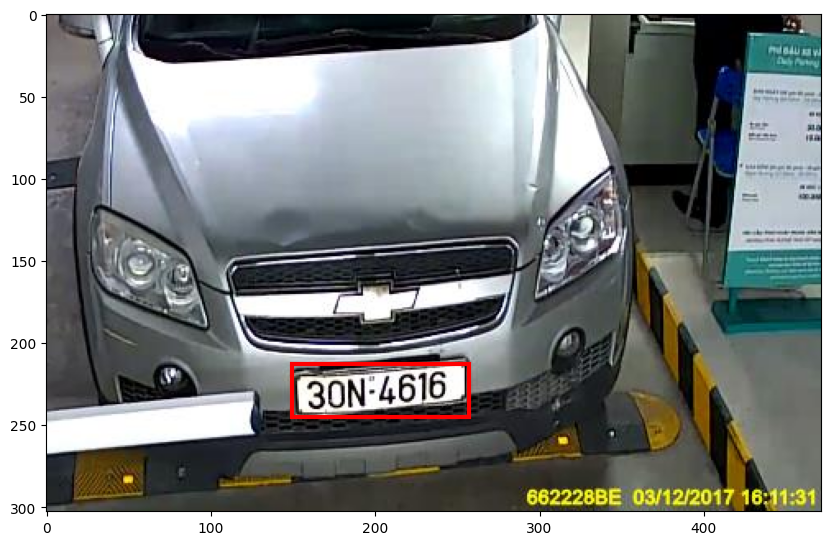

In [ ]:
# Define the filename of the image you want to process
image_filename = 'CarLongPlate434.jpg'

# Create the full path to the image file
image_path = os.path.join(IMAGES_PATH, image_filename)

# Read the image from the specified file
img = plt.imread(image_path)

# Create a figure and axes for displaying the image
fig, ax = plt.subplots(figsize=(10, 8))

# Display the image on the axes
ax.imshow(img)

# Get the index of the image in a DataFrame (df) based on the filename
image_idx = df[df['filename'] == image_filename].index

# Extract information about bounding boxes
x_min = df.loc[image_idx, 'xmin'].values
y_min = df.loc[image_idx, 'ymin'].values
box_width = (df.loc[image_idx, 'xmax'] - df.loc[image_idx, 'xmin']).values
box_height = (df.loc[image_idx, 'ymax'] - df.loc[image_idx, 'ymin']).values

# Loop through all bounding boxes and draw rectangles
for i in range(len(image_idx)):
    rect = patches.Rectangle(
        (x_min[i], y_min[i]),  # Coordinates of the top-left corner
        box_width[i],  # Width of the rectangle
        box_height[i],  # Height of the rectangle
        linewidth=3,  # Line width
        edgecolor='r',  # Line color (red in this case)
        facecolor='none'  # No fill color (none)
    )
    ax.add_patch(rect)  # Add the rectangle to the image

# The code above adds red bounding boxes to the image based on the coordinates and dimensions
# extracted from a DataFrame (df) for the specified image.


Creating a function for visualizing dataset image with bounding box

In [ ]:
def plot_bounding_box(image_folder, image_filename, df=df):

    # Create the full path to the image
    image_path = os.path.join(image_folder, image_filename)
    # Read the image
    img = plt.imread(image_path)
    # Create a figure and coordinate axes
    fig, ax = plt.subplots(figsize=(10, 8))
    # Display the image
    ax.imshow(img)

    # Find the index of the image in the DataFrame
    image_idx = df[df['filename'] == image_filename].index

    # Find the coordinates of the bottom-left corner
    x_min = df.loc[image_idx, 'xmin'].values
    y_min = df.loc[image_idx, 'ymin'].values
    # Find the width and height of the bounding box
    box_width = (df.loc[image_idx, 'xmax'] - df.loc[image_idx, 'xmin']).values
    box_height = (df.loc[image_idx, 'ymax'] - df.loc[image_idx, 'ymin']).values
    # Since there may be multiple bounding boxes, loop through all of them
    for i in range(len(image_idx)):
        # Create a rectangle
        rect = patches.Rectangle(
            (x_min[i], y_min[i]),  # Coordinates of the reference point
            box_width[i],  # Width of the rectangle
            box_height[i],  # Height of the rectangle
            linewidth=3,  # Line width
            edgecolor='r',  # Line color (red)
            facecolor='none'  # No fill color (none)
        )
        # Overlay the rectangle on top of the image
        ax.add_patch(rect)


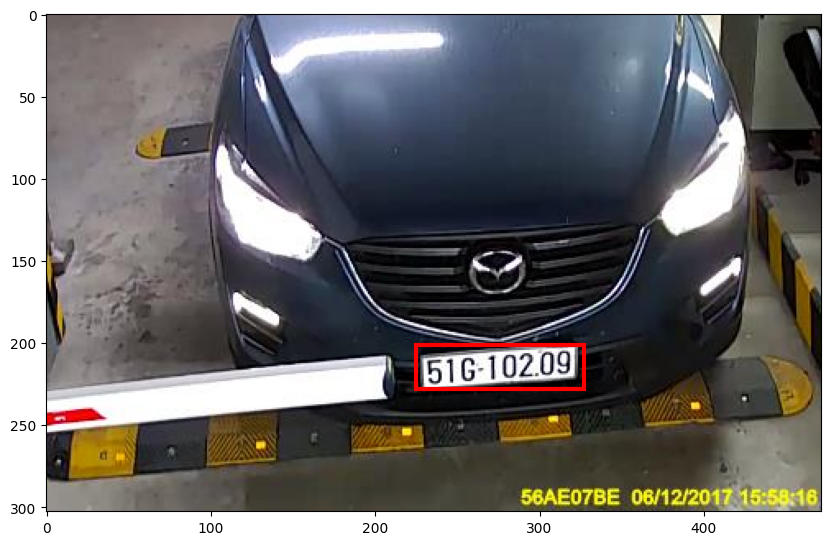

In [ ]:
plot_bounding_box(image_folder=IMAGES_PATH, image_filename='CarLongPlate455.jpg', df=df)

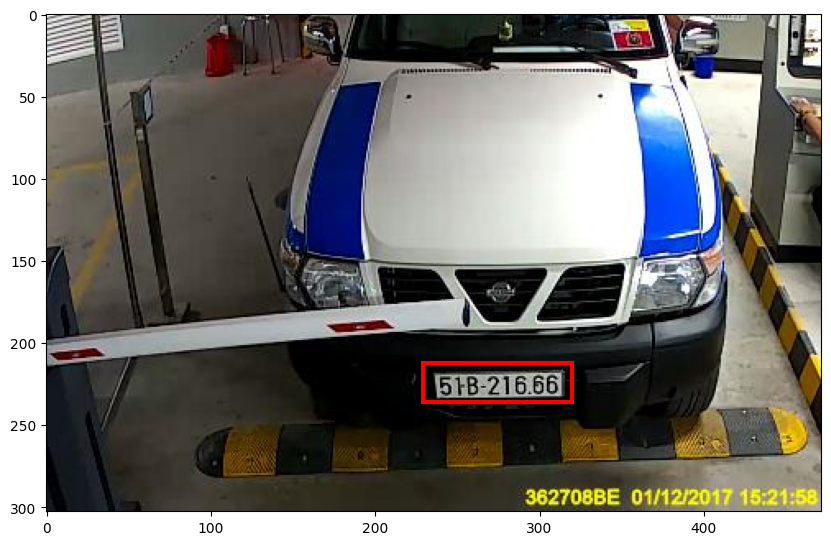

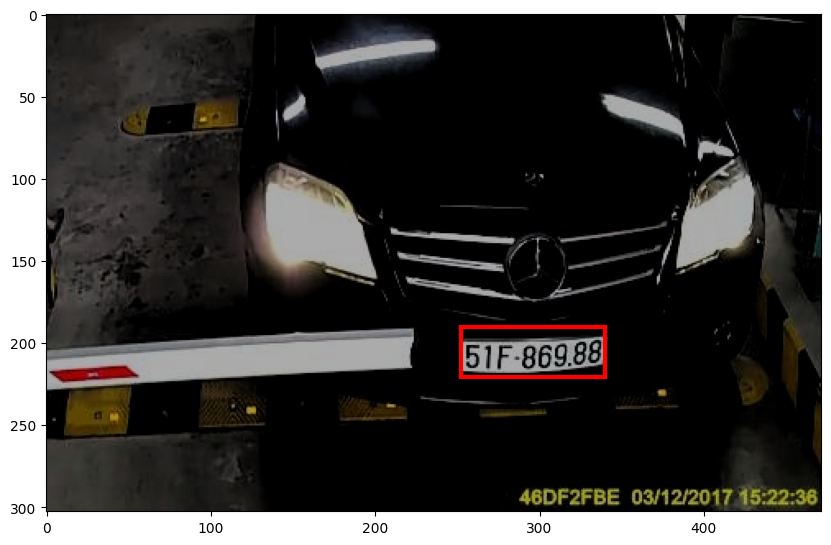

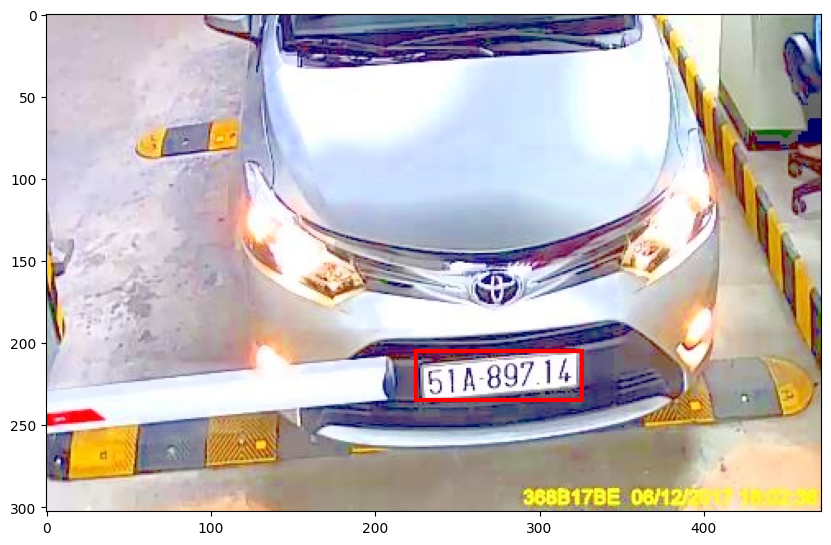

In [ ]:
#Visualizing 3 such random images
count = 3
for i in range(count):
    random_image_idx = np.random.choice(df.shape[0])
    image_filename = df.loc[random_image_idx, 'filename']
    plot_bounding_box(IMAGES_PATH, image_filename, df)

# Converting Pascal VOC formt to yolo format

In [ ]:
import os
import xml.etree.ElementTree as ET
import shutil
import random

In [ ]:
import os

directory_path = '/content/drive/My Drive/voc_plate_dataset/JPEGImages'

all_items = os.listdir(directory_path)

files = [item for item in all_items if os.path.isfile(os.path.join(directory_path, item))]

num_files = len(files)

print(f"Number of files in '{directory_path}': {num_files}")

Number of files in '/content/drive/My Drive/voc_plate_dataset/JPEGImages': 8308


In [ ]:
from IPython.display import display
from glob import glob
root_path = '/content/drive/My Drive/voc_plate_dataset/JPEGImages/*'
images_data = glob(root_path)

Creating an output file in yolo format alongside with the bounding box

In [ ]:
def convert_annotation(xml_path, img_path, output_label_path):
    try:
        tree = ET.parse(xml_path)
        root = tree.getroot()

        # Extract image dimensions
        size = root.find('size')
        w = int(size.find('width').text)
        h = int(size.find('height').text)

        # Open output file
        with open(output_label_path, 'w') as out_file:
            for obj in root.iter('object'):
                # Get class name (assuming 'licence' is class 0)
                cls_name = obj.find('name').text
                if cls_name == 'plate':
                    cls_id = 0
                else:
                    continue

                # Get bounding box coordinates
                xmlbox = obj.find('bndbox')
                b = (float(xmlbox.find('xmin').text), float(xmlbox.find('ymin').text),
                     float(xmlbox.find('xmax').text), float(xmlbox.find('ymax').text))
                bb = (b[0] + b[2]) / 2 / w, (b[1] + b[3]) / 2 / h, (b[2] - b[0]) / w, (b[3] - b[1]) / h

                # Write to output file in YOLO format
                out_file.write(str(cls_id) + ' ' + ' '.join([str(a) for a in bb]) + '\n')

    except Exception as e:
        print(f'Error processing {xml_path}: {e}')

Segregating the dataset into train, val and images labels respectively

In [ ]:
def main():
    # Directories
    base_dir = '/content/drive/My Drive/voc_plate_dataset/voc_plate_dataset/'
    img_dir = os.path.join(base_dir, 'JPEGImages')
    xml_dir = os.path.join(base_dir, 'Annotations')

    train_img_output_dir = os.path.join(base_dir, 'train/images')
    train_label_output_dir = os.path.join(base_dir, 'train/labels')
    val_img_output_dir = os.path.join(base_dir, 'val/images')
    val_label_output_dir = os.path.join(base_dir, 'val/labels')

    # Create output directories if they don't exist
    for dir_path in [train_img_output_dir, train_label_output_dir, val_img_output_dir, val_label_output_dir]:
        if not os.path.exists(dir_path):
            os.makedirs(dir_path)
     # Process each XML file
    xml_files = [f for f in os.listdir(xml_dir) if f.endswith('.xml')]
    total_files = len(xml_files)
    train_split = int(0.8 * total_files)  # 80% for training

    random.shuffle(xml_files)

    for idx, xml_file in enumerate(xml_files):
        img_file = xml_file.replace('.xml', '.jpg')
        if os.path.exists(os.path.join(img_dir, img_file)):
            if idx < train_split:
                img_output_path = os.path.join(train_img_output_dir, img_file)
                label_output_path = os.path.join(train_label_output_dir, img_file.replace('.jpg', '.txt'))
            else:
                img_output_path = os.path.join(val_img_output_dir, img_file)
                label_output_path = os.path.join(val_label_output_dir, img_file.replace('.jpg', '.txt'))

            # Copy image to respective directory
            shutil.copy(os.path.join(img_dir, img_file), img_output_path)

            # Convert annotation
            convert_annotation(os.path.join(xml_dir, xml_file), img_output_path, label_output_path)


main()

# Aglorithms to Dectect the License Plate

**Installing the yolo algorithm**


In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.2/645.2 kB 9.0 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

Using the yolo version8s for the implemtation

In [ ]:
model = YOLO('yolov8s.pt')

100%|██████████| 21.5M/21.5M [00:00<00:00, 164MB/s]


**Creating a configuration .yaml file required to train a  yolo model**

In [ ]:
import yaml

In [ ]:
config = {
    'path': '/content/drive/My Drive/voc_plate_dataset/',
    'train': 'train/images',
    'val': 'val/images',
    'nc': 1,
    'names': ['plate'],

}

In [ ]:
yaml_file_path = '/content/drive/My Drive/voc_plate_dataset/config.yaml'

with open(yaml_file_path, 'w') as yaml_file:
    yaml.dump(config, yaml_file)

print(f"YAML configuration file saved at: {yaml_file_path}")

YAML configuration file saved at: /content/drive/My Drive/voc_plate_dataset/config.yaml


Training the Yolo Model for about 50 epochs

In [ ]:
 #results = model.train(data='/content/drive/My Drive/voc_plate_dataset/config.yaml',
 #                     epochs=50,
 #                      imgsz=640,
 #                      pretrained = True ,
 #                      name= "license_plate_detection_3",
 #                      patience = 35,
 #                      flipud=0.5,
 #                      batch = 32,
 #                      optimizer = 'Adam',
 #                      augment = True
 #                      )


from ultralytics import YOLO
model = YOLO("/content/drive/MyDrive/License plate detection/detect/license_plate_detection_32/weights/best.pt")

In [ ]:
!ls /content/runs/detect/license_plate_detection_32/weights

In [ ]:
import shutil

source_directory = '/content/runs'
destination_directory = '/content/drive/MyDrive/License plate detection/'

shutil.copytree(source_directory, destination_directory)

FileExistsError: ignored

In [ ]:
results=model.val()

Ultralytics YOLOv8.0.207 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs


FileNotFoundError: ignored

In [ ]:
for i in [0.25,0.15,0.05]:
  results = model.val(name= f'confidence: {i}', conf= i , iou=0.8)

Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
val: Scanning /content/drive/My Drive/voc_plate_dataset/voc_plate_dataset/val/labels.cache... 601 images, 0 backgrounds, 0 corrupt: 100%|██████████| 601/601 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:15<00:00,  1.25it/s]
                   all        601        605       0.98      0.954      0.986      0.694
Speed: 0.2ms preprocess, 16.0ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/confidence: 0.25
Ultralytics YOLOv8.0.203 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
val: Scanning /content/drive/My Drive/voc_plate_dataset/voc_plate_dataset/val/labels.cache... 601 images, 0 backgrounds, 0 corrupt: 100%|██████████| 601/601 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:15<

In [ ]:
plot_filepath = '/content/drive/MyDrive/License plate detection/detect/license_plate_detection_32/results.png'

plt.savefig(plot_filepath)
plt.show()

<Figure size 640x480 with 0 Axes>

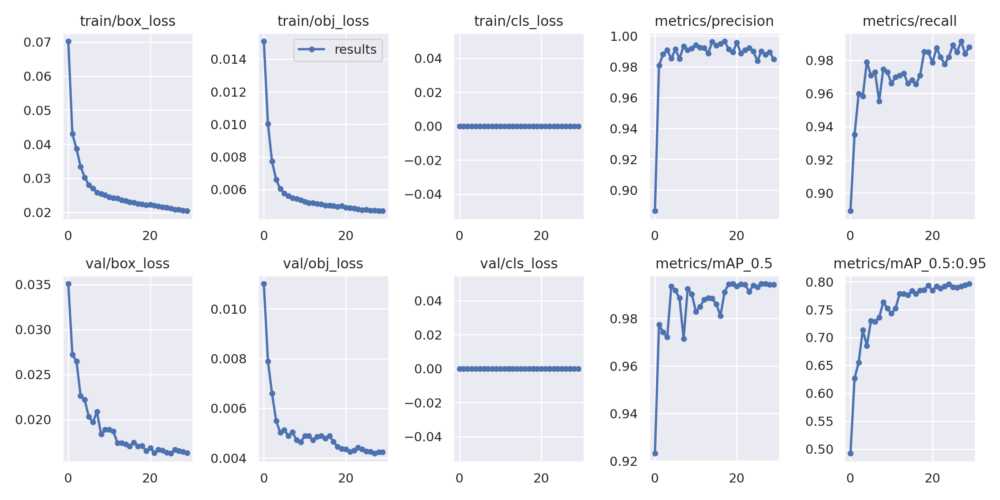

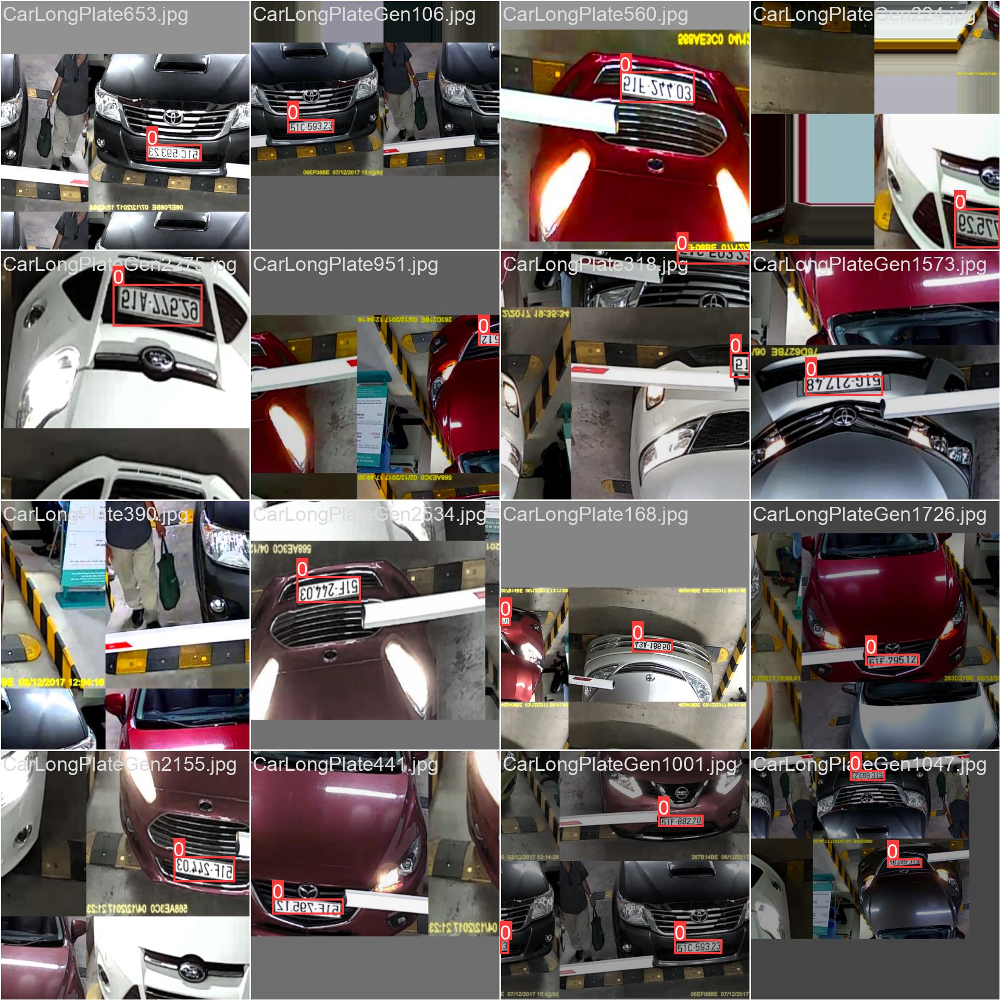

In [ ]:
import cv2
from glob import glob

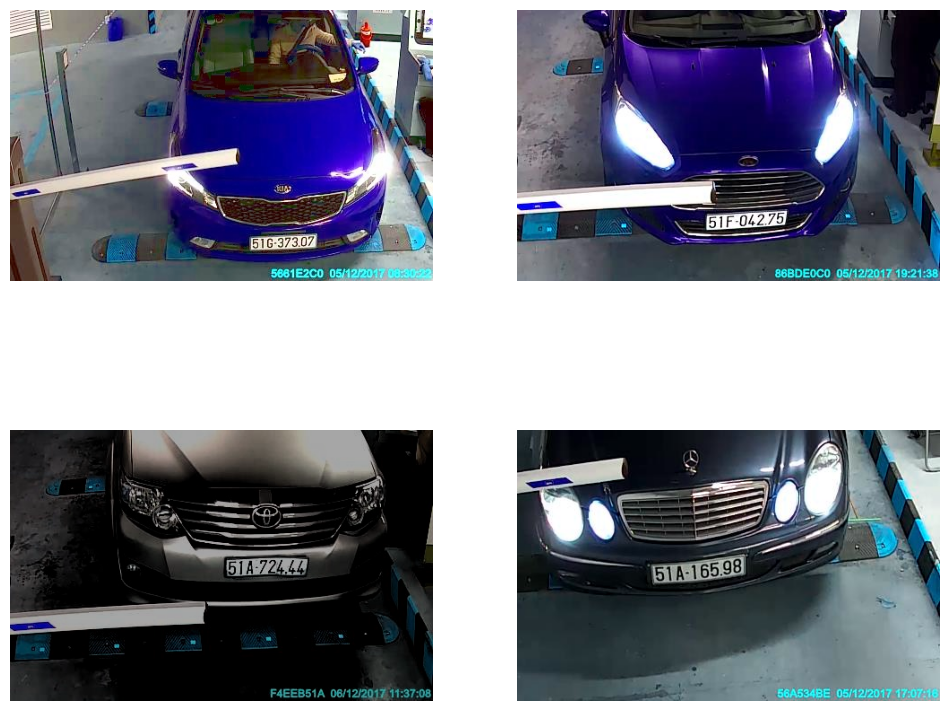

In [ ]:
root_path = '/content/drive/My Drive/voc_plate_dataset/val/images/*'
num_samples = 4
images_data = glob(root_path)
random_image = random.sample(images_data, num_samples)

plt.figure(figsize=(12,10))
for i in range(num_samples):
    plt.subplot(2,2,i+1)
    plt.imshow(cv2.imread(random_image[i]))
    plt.axis('off')

In [ ]:
print(random_image)

['/content/drive/My Drive/voc_plate_dataset/val/images/CarLongPlateGen1236.jpg', '/content/drive/My Drive/voc_plate_dataset/val/images/CarLongPlate302.jpg', '/content/drive/My Drive/voc_plate_dataset/val/images/CarLongPlateGen1557.jpg', '/content/drive/My Drive/voc_plate_dataset/val/images/CarLongPlate205.jpg']


In [ ]:
from google.colab.patches import cv2_imshow

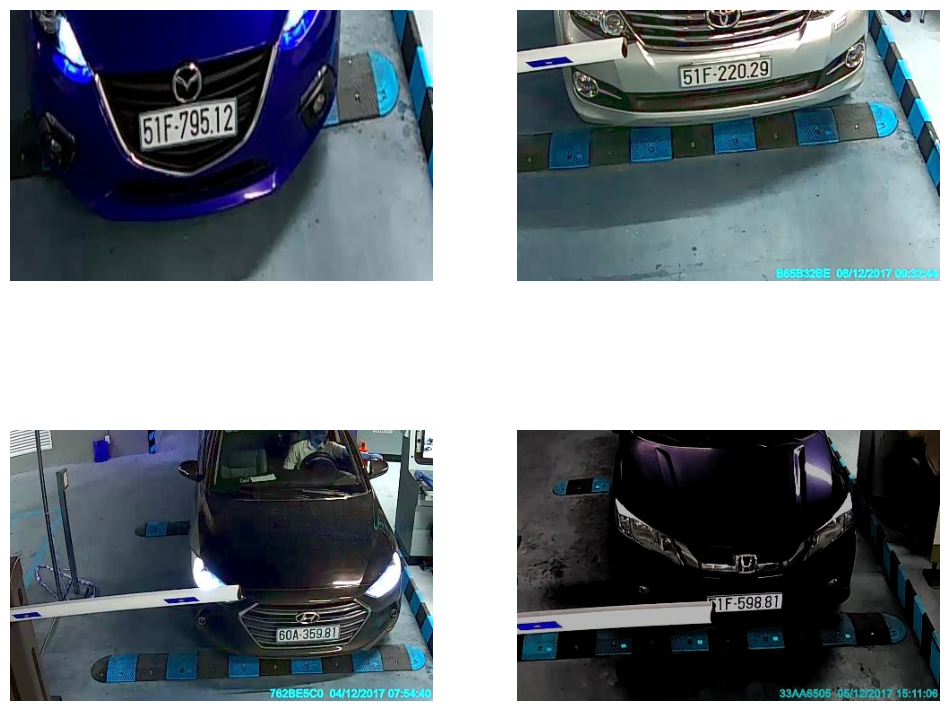

In [ ]:
root_path = '/content/drive/MyDrive/voc_plate_dataset/val/images/*'
num_samples = 4
images_data = glob(root_path)
random_image = random.sample(images_data, num_samples)

plt.figure(figsize=(12,10))
for i in range(num_samples):
    plt.subplot(2,2,i+1)
    plt.imshow(cv2.imread(random_image[i]))
    plt.axis('off')

In [ ]:
images = []
for i in range(num_samples):
    yolo_outputs = model.predict(random_image[i])
    output = yolo_outputs[0]
    box = output.boxes
    names = output.names
    print('**********************')
    for j in range(len(box)):
        labels = names[box.cls[j].item()]
        coordinates = box.xyxy[j].tolist()
        confidence = np.round(box.conf[j].item(), 2)
        print(f'In this image {len(box)} License plate has been detected.')
        print(f'License {j + 1} is: {labels}')
        print(f'Coordinates are: {coordinates}')
        print(f'Confidence is: {confidence}')
        print('-------------------------------------------')

    # Store the image in the 'images' list
    images.append(output.plot()[:, :, ::-1])


image 1/1 /content/drive/MyDrive/voc_plate_dataset/val/images/CarLongPlateGen2012.jpg: 416x640 1 plate, 14.6ms
Speed: 4.0ms preprocess, 14.6ms inference, 2.7ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /content/drive/MyDrive/voc_plate_dataset/val/images/CarLongPlateGen1472.jpg: 416x640 1 plate, 12.7ms
Speed: 2.3ms preprocess, 12.7ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /content/drive/MyDrive/voc_plate_dataset/val/images/CarLongPlateGen1110.jpg: 416x640 1 plate, 12.7ms
Speed: 2.2ms preprocess, 12.7ms inference, 2.5ms postprocess per image at shape (1, 3, 416, 640)

image 1/1 /content/drive/MyDrive/voc_plate_dataset/val/images/CarLongPlateGen1317.jpg: 416x640 1 plate, 12.6ms
Speed: 2.1ms preprocess, 12.6ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


**********************
In this image 1 License plate has been detected.
License 1 is: plate
Coordinates are: [138.80047607421875, 100.04243469238281, 259.602294921875, 160.89517211914062]
Confidence is: 0.76
-------------------------------------------
**********************
In this image 1 License plate has been detected.
License 1 is: plate
Coordinates are: [178.66969299316406, 53.901092529296875, 287.7716064453125, 87.60755157470703]
Confidence is: 0.76
-------------------------------------------
**********************
In this image 1 License plate has been detected.
License 1 is: plate
Coordinates are: [295.1058654785156, 216.8089141845703, 368.337646484375, 239.21142578125]
Confidence is: 0.82
-------------------------------------------
**********************
In this image 1 License plate has been detected.
License 1 is: plate
Coordinates are: [209.81947326660156, 179.72532653808594, 297.7084655761719, 205.29837036132812]
Confidence is: 0.78
----------------------------------------

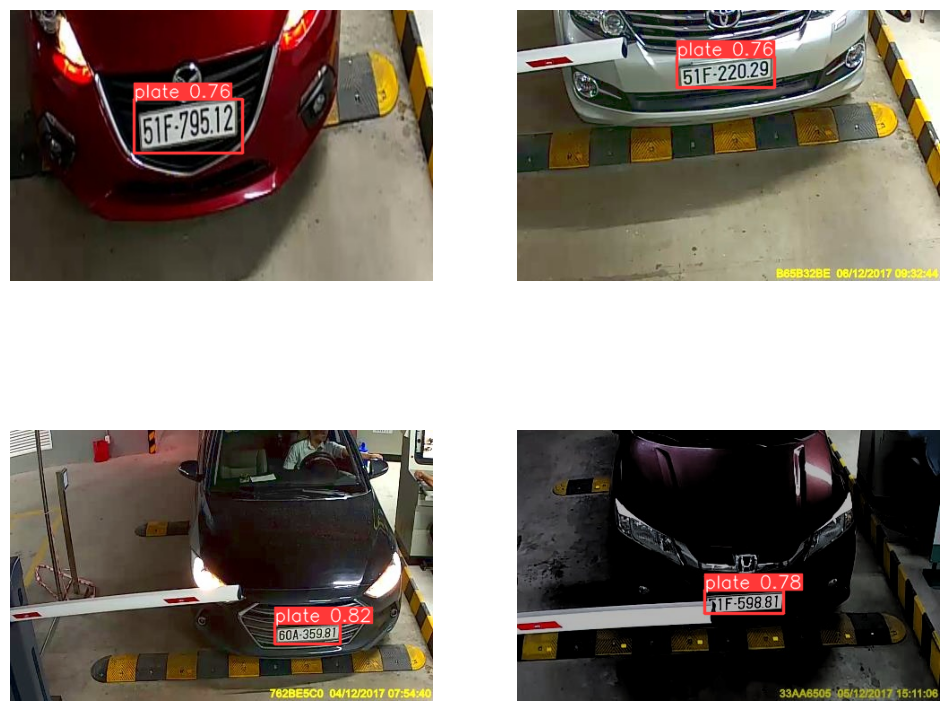

In [ ]:

plt.figure(figsize=(12,10))
for i, img in enumerate(images):
    plt.subplot(2, 2, i + 1)
    plt.imshow(img)
    plt.axis('off')

# plt/.show()

## Character recognition using OCR

In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

In [ ]:
!pip install easyocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 24.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.2/307.2 kB 22.5 MB/s eta 0:00:00


In [ ]:
!pip install pytesseract

Importing all the required libraries

In [ ]:
import cv2
import pytesseract
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import random

In [ ]:
import easyocr

reader = easyocr.Reader(['en'])  # Initialize EasyOCR with the desired language(s)

def extract_text_from_image(image, coordinates):
    xmin, ymin, xmax, ymax = map(int, coordinates)
    roi = image[ymin:ymax, xmin:xmax]

    # Use EasyOCR to extract text
    results = reader.readtext(roi)
    extracted_text = ' '.join(result[1] for result in results)

    return extracted_text.strip()


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete


0: 416x640 1 plate, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 plate, 13.3ms
Speed: 2.9ms preprocess, 13.3ms inference, 2.3ms postprocess per image at shape (1, 3, 416, 640)

0: 416x640 1 plate, 12.7ms
Speed: 2.2ms preprocess, 12.7ms inference, 1.9ms postprocess per image at shape (1, 3, 416, 640)


**********************
In this image 1 License plate has been detected.
License 1 is: plate
Coordinates are: [126.41805267333984, 223.12071228027344, 229.41448974609375, 253.54457092285156]
Confidence is: 0.79
Extracted text from license plate: IBE-Q0g
--------------------------------
**********************
In this image 1 License plate has been detected.
License 1 is: plate
Coordinates are: [242.18435668945312, 178.2624969482422, 340.86334228515625, 207.4539337158203]
Confidence is: 0.8
Extracted text from license plate: 614.89214
--------------------------------
**********************
In this image 1 License plate has been detected.
License 1 is: plate
Coordinates are: [246.8562469482422, 176.84376525878906, 339.63665771484375, 203.74261474609375]
Confidence is: 0.8



0: 416x640 2 plates, 18.2ms
Speed: 5.1ms preprocess, 18.2ms inference, 3.1ms postprocess per image at shape (1, 3, 416, 640)


Extracted text from license plate: LBA-05177
--------------------------------
**********************
In this image 2 License plate has been detected.
License 1 is: plate
Coordinates are: [245.81524658203125, 125.41053771972656, 371.8308410644531, 151.7863311767578]
Confidence is: 0.7
Extracted text from license plate: Th5273
--------------------------------
In this image 2 License plate has been detected.
License 2 is: plate
Coordinates are: [244.42111206054688, 126.87117767333984, 321.5769958496094, 149.38636779785156]
Confidence is: 0.53
Extracted text from license plate: Th52
--------------------------------


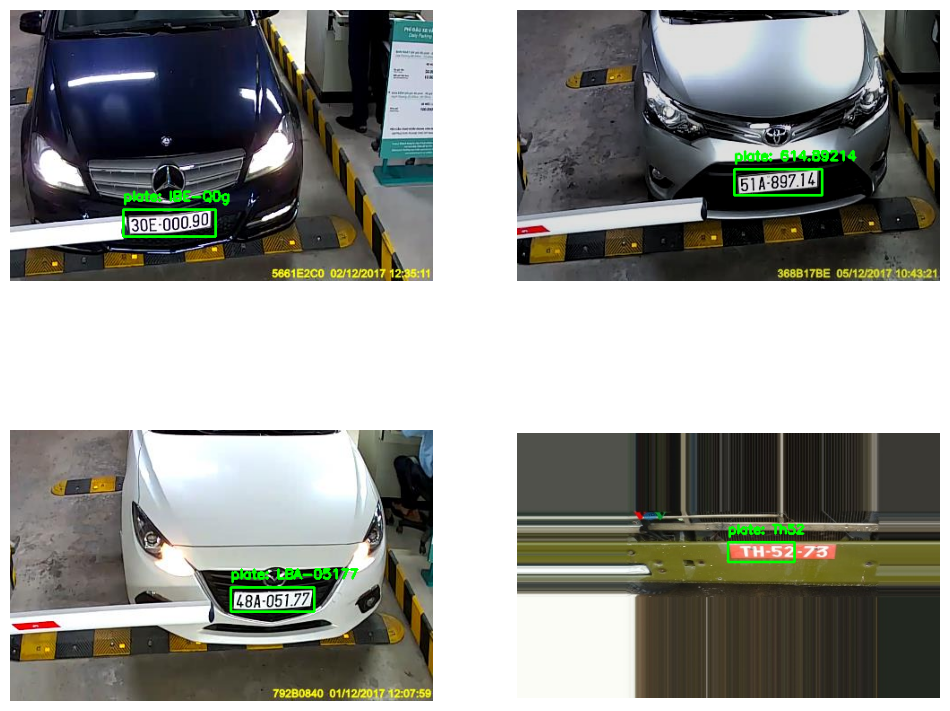

In [ ]:
root_path = '/content/drive/MyDrive/voc_plate_dataset/val/images/*'
num_samples = 4
images_data = glob(root_path)
random_image_paths = random.sample(images_data, num_samples)
plt.figure(figsize=(12, 10))

for i in range(num_samples):
    image_np = cv2.imread(random_image_paths[i])  # Use random_image_paths instead of random_image
    yolo_outputs = model.predict(image_np)
    output = yolo_outputs[0]
    box = output.boxes
    names = output.names
    print('**********************')
    for j in range(len(box)):
        labels = names[box.cls[j].item()]
        coordinates = box.xyxy[j].tolist()
        confidence = np.round(box.conf[j].item(), 2)
        print(f'In this image {len(box)} License plate has been detected.')
        print(f'License {j + 1} is: {labels}')
        print(f'Coordinates are: {coordinates}')
        print(f'Confidence is: {confidence}')

        # Extract text using OCR
        extracted_text = extract_text_from_image(image_np, coordinates)
        print(f'Extracted text from license plate: {extracted_text}')

        # Append bounding box and text to the image
        image_with_bb = image_np.copy()
        x1, y1, x2, y2 = map(int, coordinates)
        cv2.rectangle(image_with_bb, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Draw bounding box
        cv2.putText(image_with_bb, f'{labels}: {extracted_text}', (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        print('--------------------------------')
        plt.subplot(2, 2, i + 1)
        plt.imshow(cv2.cvtColor(image_with_bb, cv2.COLOR_BGR2RGB))  # Display the image with bounding box and text
        plt.axis('off')

plt.show()


#  Character segmentation to extract text on license plate

In [ ]:
def crop(img, box):
  box.xyxy[0]

In [ ]:
# Match contours to license plate or character template
def find_contours(dimensions, img) :

    # Find all contours in the image
    cntrs, _ = cv2.findContours(img.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Retrieve potential dimensions
    lower_width = dimensions[0]
    upper_width = dimensions[1]
    lower_height = dimensions[2]
    upper_height = dimensions[3]

    # Check largest 5 or  15 contours for license plate or character respectively
    cntrs = sorted(cntrs, key=cv2.contourArea, reverse=True)[:15]

    ii = cv2.imread('contour.jpg')

    x_cntr_list = []
    target_contours = []
    img_res = []
    for cntr in cntrs :
        # detects contour in binary image and returns the coordinates of rectangle enclosing it
        intX, intY, intWidth, intHeight = cv2.boundingRect(cntr)

        # checking the dimensions of the contour to filter out the characters by contour's size
        if intWidth > lower_width and intWidth < upper_width and intHeight > lower_height and intHeight < upper_height :
            x_cntr_list.append(intX) #stores the x coordinate of the character's contour, to used later for indexing the contours

            char_copy = np.zeros((44,24))
            # extracting each character using the enclosing rectangle's coordinates.
            char = img[intY:intY+intHeight, intX:intX+intWidth]
            char = cv2.resize(char, (20, 40))

            cv2.rectangle(ii, (intX,intY), (intWidth+intX, intY+intHeight), (50,21,200), 2)
            plt.imshow(ii, cmap='gray')
            plt.title('Predict Segments')

            # Make result formatted for classification: invert colors
            char = cv2.subtract(255, char)

            # Resize the image to 24x44 with black border
            char_copy[2:42, 2:22] = char
            char_copy[0:2, :] = 0
            char_copy[:, 0:2] = 0
            char_copy[42:44, :] = 0
            char_copy[:, 22:24] = 0

            img_res.append(char_copy) # List that stores the character's binary image (unsorted)

    # Return characters on ascending order with respect to the x-coordinate (most-left character first)

    plt.show()
    # arbitrary function that stores sorted list of character indeces
    indices = sorted(range(len(x_cntr_list)), key=lambda k: x_cntr_list[k])
    img_res_copy = []
    for idx in indices:
        img_res_copy.append(img_res[idx])# stores character images according to their index
    img_res = np.array(img_res_copy)

    return img_res

In [ ]:
# Find characters in the resulting images
def segment_characters(image) :

    # Preprocess cropped license plate image
    img_lp = cv2.resize(image, (333, 75))
    img_gray_lp = cv2.cvtColor(img_lp, cv2.COLOR_BGR2GRAY)
    _, img_binary_lp = cv2.threshold(img_gray_lp, 200, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    img_binary_lp = cv2.erode(img_binary_lp, (3,3))
    img_binary_lp = cv2.dilate(img_binary_lp, (3,3))

    LP_WIDTH = img_binary_lp.shape[0]
    LP_HEIGHT = img_binary_lp.shape[1]

    # Make borders white
    img_binary_lp[0:3,:] = 255
    img_binary_lp[:,0:3] = 255
    img_binary_lp[72:75,:] = 255
    img_binary_lp[:,330:333] = 255

    # Estimations of character contours sizes of cropped license plates
    dimensions = [LP_WIDTH/6,
                       LP_WIDTH/2,
                       LP_HEIGHT/10,
                       2*LP_HEIGHT/3]
    plt.imshow(img_binary_lp, cmap='gray')
    plt.title('Contour')
    plt.show()
    cv2.imwrite('contour.jpg',img_binary_lp)

    # Get contours within cropped license plate
    char_list = find_contours(dimensions, img_binary_lp)

    return char_list


0: 480x640 3 plates, 63.1ms
Speed: 2.1ms preprocess, 63.1ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


**********************
[111.95966339111328, 211.9555206298828, 156.73260498046875, 229.74542236328125]
211 440 111 267


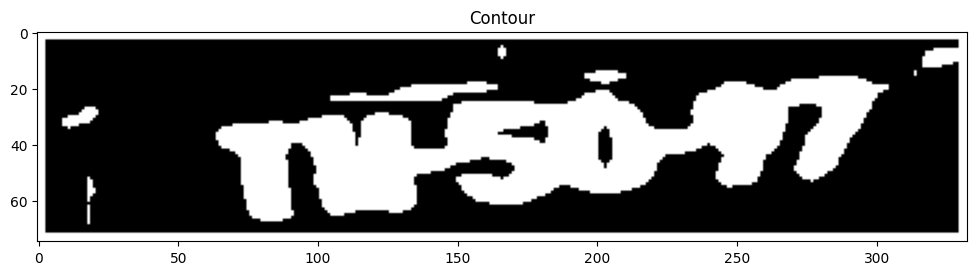

[356.3044738769531, 144.63711547851562, 400.52105712890625, 158.09922790527344]
144 302 356 756


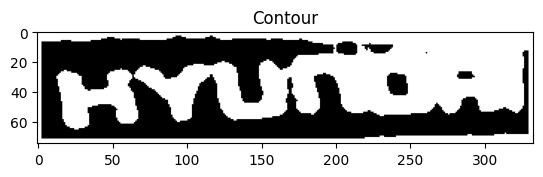

[376.0173645019531, 187.61798095703125, 399.3153991699219, 201.00286865234375]
187 388 376 775


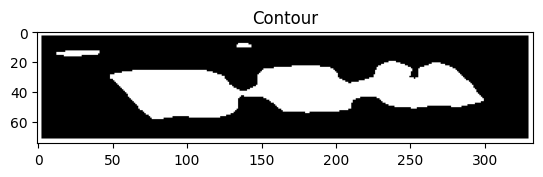


0: 416x640 1 plate, 13.6ms
Speed: 4.7ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


**********************
[103.3467788696289, 144.4275360107422, 217.2828369140625, 175.44180297851562]
144 319 103 320


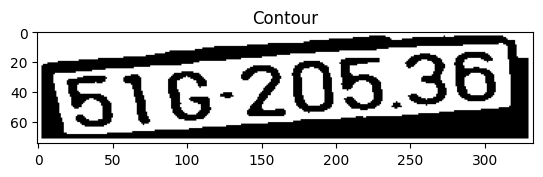

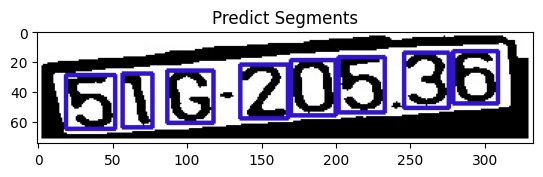


0: 416x640 1 plate, 13.6ms
Speed: 2.5ms preprocess, 13.6ms inference, 2.1ms postprocess per image at shape (1, 3, 416, 640)


**********************
[210.9210662841797, 208.8903350830078, 309.919677734375, 237.75936889648438]
208 445 210 519


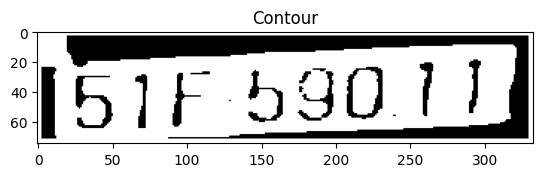

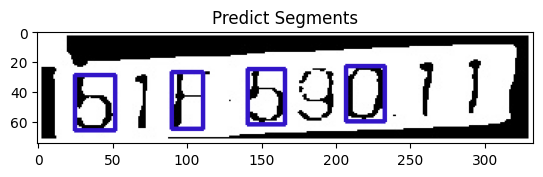


0: 416x640 1 plate, 14.2ms
Speed: 3.4ms preprocess, 14.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


**********************
[117.0508041381836, 185.6813201904297, 220.17494201660156, 218.7718048095703]
185 403 117 337


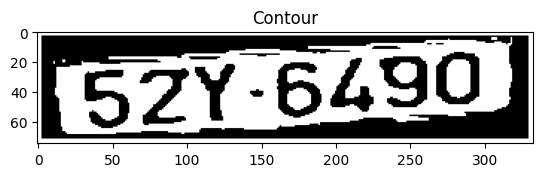

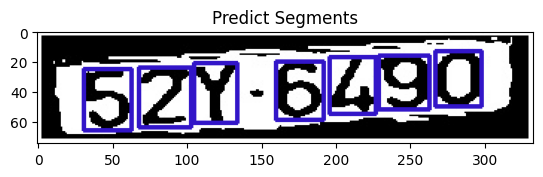

In [ ]:
root_path = '/content/drive/MyDrive/voc_plate_dataset/val/images/*'
num_samples = 4
images_data = glob(root_path)
random_image_paths = random.sample(images_data, num_samples)
plt.figure(figsize=(12, 10))

for i in range(num_samples):
    image_np = cv2.imread(random_image_paths[i])  # Use random_image_paths instead of random_image
    yolo_outputs = model.predict(image_np)
    output = yolo_outputs[0]
    box = output.boxes
    names = output.names
    print('**********************')
    for j in range(len(box)):
      cor = box[j].xyxy.tolist()[0]
      #print(cor)
      left =int(cor[0])
      top =int(cor[1])
      width = int(cor[2])
      height = int(cor[3])


      # calculate bottom and right
      bottom = top + height
      right = left + width
      print(cor)
      print(top,bottom,left,right)
      cropped = image_np[top:height, left:width].copy()
      plt.imshow(cropped)
      char=segment_characters(cropped)



plt.show()

In [ ]:
!yolo export model='/content/drive/MyDrive/License plate detection/detect/license_plate_detection_32/weights/best.pt' format=tflite

Ultralytics YOLOv8.0.206 🚀 Python-3.10.12 torch-2.1.0+cu118 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs

PyTorch: starting from '/content/drive/MyDrive/License plate detection/detect/license_plate_detection_32/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (21.5 MB)
requirements: Ultralytics requirement ['onnxruntime'] not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.2/6.2 MB 19.1 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 8.4s, installed 1 package: ['onnxruntime']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


TensorFlow SavedModel: starting export with tensorflow 2.13.1...

ONNX: starting export with onnx 1.15.0 opset 17...
ONNX: simplifying with onnxsim 0.4.35...
ONNX: export success ✅ 4.8s, saved as '/content/drive/MyDrive/License p

# Converting the yolo model into tflite (model optimization)

In [ ]:
tf_model = YOLO("/content/drive/MyDrive/License plate detection/detect/license_plate_detection_32/weights/best_saved_model")

In [ ]:

images = []
for i in range(num_samples):
    yolo_outputs = tf_model.predict(random_image[i])
    output = yolo_outputs[0]
    box = output.boxes
    names = output.names
    print('**********************')
    for j in range(len(box)):
        labels = names[box.cls[j].item()]
        coordinates = box.xyxy[j].tolist()
        confidence = np.round(box.conf[j].item(), 2)
        print(f'In this image {len(box)} License plate has been detected.')
        print(f'License {j + 1} is: {labels}')
        print(f'Coordinates are: {coordinates}')
        print(f'Confidence is: {confidence}')
        print('-------------------------------------------')

    # Store the image in the 'images' list
    images.append(output.plot()[:, :, ::-1])

Loading /content/drive/MyDrive/License plate detection/detect/license_plate_detection_32/weights/best_saved_model for TensorFlow SavedModel inference...

image 1/1 /content/drive/MyDrive/voc_plate_dataset/val/images/CarLongPlateGen2012.jpg: 640x640 1 plate, 4581.4ms
Speed: 3.9ms preprocess, 4581.4ms inference, 22.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/voc_plate_dataset/val/images/CarLongPlateGen1472.jpg: 640x640 1 plate, 50.4ms
Speed: 3.8ms preprocess, 50.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/voc_plate_dataset/val/images/CarLongPlateGen1110.jpg: 640x640 1 plate, 39.8ms
Speed: 3.7ms preprocess, 39.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)



**********************
In this image 1 License plate has been detected.
License 1 is: plate
Coordinates are: [0.21695685386657715, 0.0, 0.405636727809906, 0.0]
Confidence is: 0.76
-------------------------------------------
**********************
In this image 1 License plate has been detected.
License 1 is: plate
Coordinates are: [0.2790549695491791, 0.0, 0.45003077387809753, 0.0]
Confidence is: 0.76
-------------------------------------------
**********************
In this image 1 License plate has been detected.
License 1 is: plate
Coordinates are: [0.4611018896102905, 0.0, 0.5755445957183838, 0.0]
Confidence is: 0.82
-------------------------------------------


image 1/1 /content/drive/MyDrive/voc_plate_dataset/val/images/CarLongPlateGen1317.jpg: 640x640 1 plate, 45.2ms
Speed: 10.1ms preprocess, 45.2ms inference, 4.5ms postprocess per image at shape (1, 3, 640, 640)


**********************
In this image 1 License plate has been detected.
License 1 is: plate
Coordinates are: [0.3257569372653961, 0.0, 0.465309739112854, 0.0]
Confidence is: 0.78
-------------------------------------------


#Testing  the solution on my images


0: 640x288 (no detections), 139.9ms
Speed: 4.1ms preprocess, 139.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 288)


(1600, 721, 3) aaaaaaaaaaaaaaa
**********************



0: 640x288 1 plate, 11.0ms
Speed: 4.3ms preprocess, 11.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 288)


(1600, 721, 3) aaaaaaaaaaaaaaa
**********************
[68.09950256347656, 868.7423095703125, 675.8414306640625, 1048.8792724609375]
868 1916 68 743


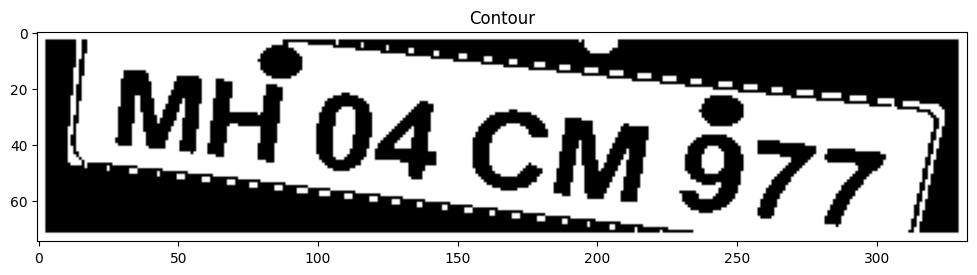


0: 288x640 (no detections), 66.2ms
Speed: 2.6ms preprocess, 66.2ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 640)


(721, 1600, 3) aaaaaaaaaaaaaaa
**********************



0: 288x640 (no detections), 11.5ms
Speed: 4.3ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 288, 640)


(721, 1600, 3) aaaaaaaaaaaaaaa
**********************



0: 288x640 2 plates, 13.3ms
Speed: 2.0ms preprocess, 13.3ms inference, 2.0ms postprocess per image at shape (1, 3, 288, 640)


(721, 1600, 3) aaaaaaaaaaaaaaa
**********************
[435.3055725097656, 378.10791015625, 1209.749267578125, 632.3836059570312]
378 1010 435 1644


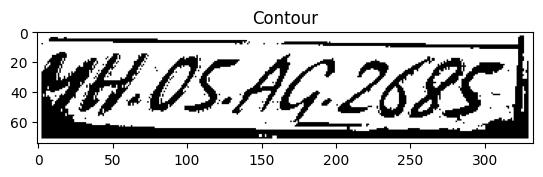

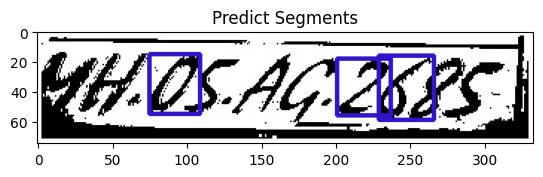

[373.97222900390625, 379.644775390625, 989.7318115234375, 618.5838012695312]
379 997 373 1362


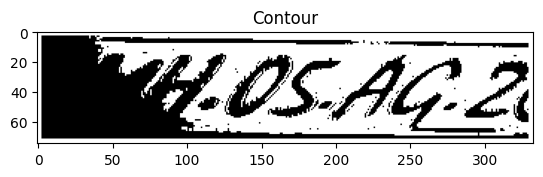


0: 640x288 1 plate, 14.3ms
Speed: 2.9ms preprocess, 14.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 288)


(1600, 721, 3) aaaaaaaaaaaaaaa
**********************
[58.96751403808594, 860.5687866210938, 642.2119140625, 1026.6805419921875]
860 1886 58 700


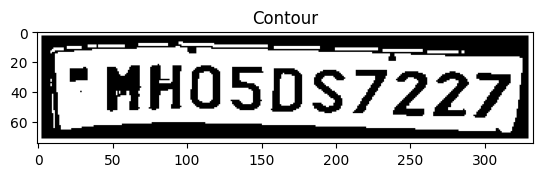

In [ ]:
root_path = '/content/drive/MyDrive/voc_plate_dataset/myimages/*'
# root_path = '/content/drive/MyDrive/voc_plate_dataset/voc_plate_dataset/val/images/*'
images_data = glob(root_path)
plt.figure(figsize=(12, 10))

for i in range(len(images_data)):
    image_np = cv2.imread(images_data[i])  # Use random_image_paths instead of random_image
    print(image_np.shape, "aaaaaaaaaaaaaaa")
    yolo_outputs = model.predict(image_np)
    output = yolo_outputs[0]
    box = output.boxes
    names = output.names
    print('**********************')
    for j in range(len(box)):
      cor = box[j].xyxy.tolist()[0]
      #print(cor)
      left =int(cor[0])
      top =int(cor[1])
      width = int(cor[2])
      height = int(cor[3])


      # calculate bottom and right
      bottom = top + height
      right = left + width
      print(cor)
      print(top,bottom,left,right)
      cropped = image_np[top:height, left:width].copy()
      plt.imshow(cropped)
      char=segment_characters(cropped)




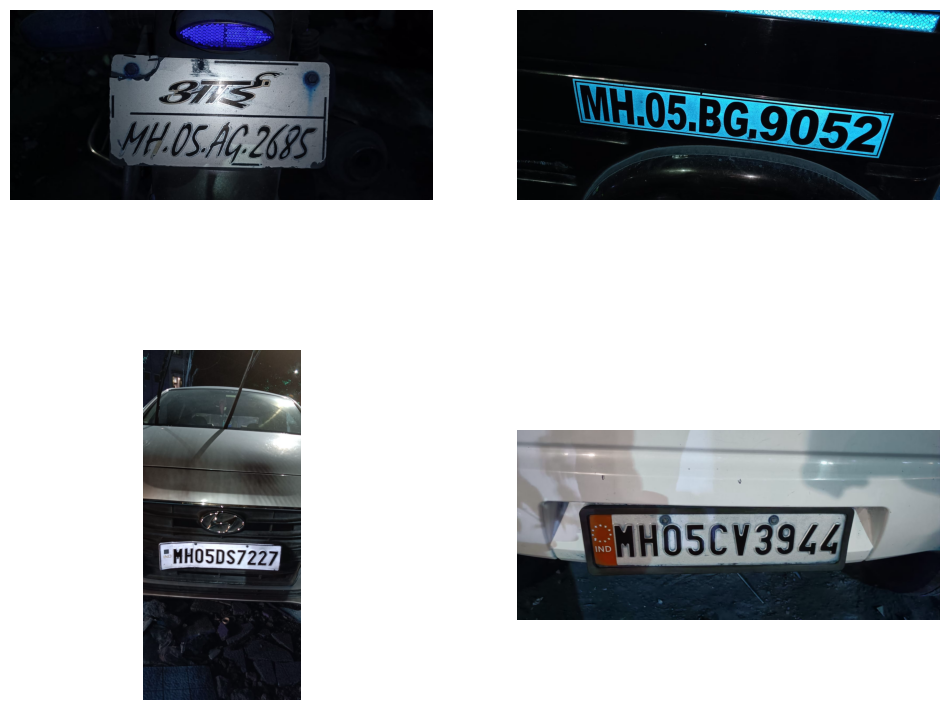

In [ ]:
root_path = '/content/drive/MyDrive/voc_plate_dataset/myimages/*'
num_samples = 4
images_data = glob(root_path)
random_image = random.sample(images_data, num_samples)

plt.figure(figsize=(12,10))
for i in range(num_samples):
    plt.subplot(2,2,i+1)
    plt.imshow(cv2.imread(random_image[i]))
    plt.axis('off')

In [ ]:
images = []
for i in range(num_samples):
    yolo_outputs = model.predict(random_image[i])
    output = yolo_outputs[0]
    box = output.boxes
    names = output.names
    print('**********************')
    for j in range(len(box)):
        labels = names[box.cls[j].item()]
        coordinates = box.xyxy[j].tolist()
        confidence = np.round(box.conf[j].item(), 2)
        print(f'In this image {len(box)} License plate has been detected.')
        print(f'License {j + 1} is: {labels}')
        print(f'Coordinates are: {coordinates}')
        print(f'Confidence is: {confidence}')
        print('-------------------------------------------')

    # Store the image in the 'images' list
    images.append(output.plot()[:, :, ::-1])


image 1/1 /content/drive/MyDrive/voc_plate_dataset/myimages/myimage3.jpeg: 288x640 2 plates, 41.9ms
Speed: 4.0ms preprocess, 41.9ms inference, 15.3ms postprocess per image at shape (1, 3, 288, 640)

image 1/1 /content/drive/MyDrive/voc_plate_dataset/myimages/myimage4.jpeg: 288x640 (no detections), 46.2ms
Speed: 9.7ms preprocess, 46.2ms inference, 13.7ms postprocess per image at shape (1, 3, 288, 640)


**********************
In this image 2 License plate has been detected.
License 1 is: plate
Coordinates are: [435.3055725097656, 378.10791015625, 1209.749267578125, 632.3836059570312]
Confidence is: 0.33
-------------------------------------------
In this image 2 License plate has been detected.
License 2 is: plate
Coordinates are: [373.97222900390625, 379.644775390625, 989.7318115234375, 618.5838012695312]
Confidence is: 0.32
-------------------------------------------
**********************



image 1/1 /content/drive/MyDrive/voc_plate_dataset/myimages/myimage6.jpeg: 640x288 1 plate, 12.9ms
Speed: 2.5ms preprocess, 12.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 288)

image 1/1 /content/drive/MyDrive/voc_plate_dataset/myimages/myimage5.jpeg: 288x640 (no detections), 51.5ms
Speed: 8.6ms preprocess, 51.5ms inference, 1.5ms postprocess per image at shape (1, 3, 288, 640)


**********************
In this image 1 License plate has been detected.
License 1 is: plate
Coordinates are: [58.96751403808594, 860.5687866210938, 642.2119140625, 1026.6805419921875]
Confidence is: 0.75
-------------------------------------------
**********************


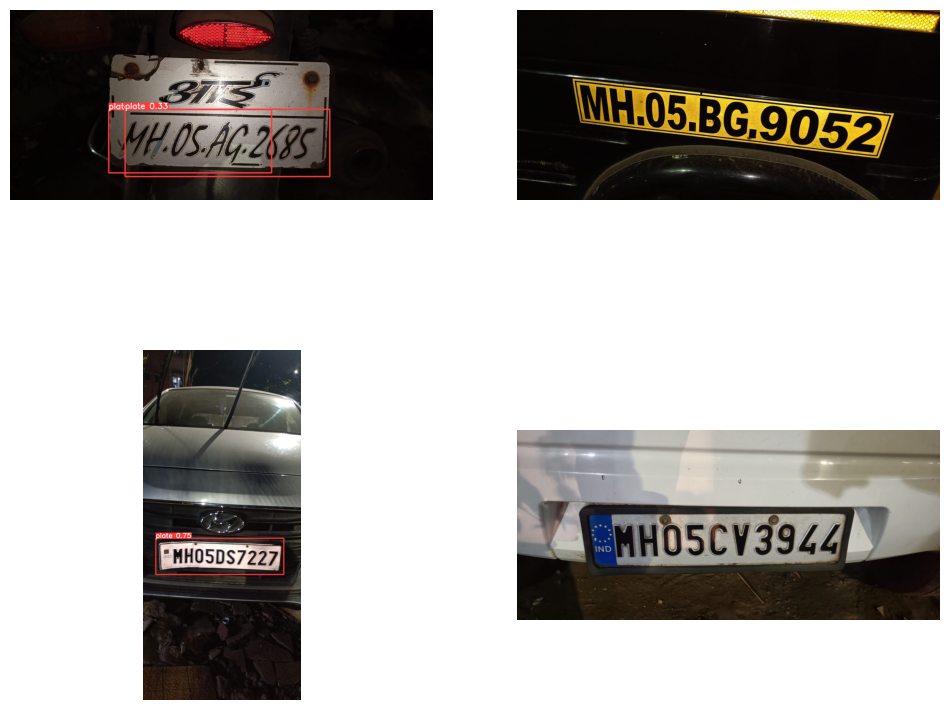

In [ ]:

plt.figure(figsize=(12,10))
for i, img in enumerate(images):
    plt.subplot(2, 2, i + 1)
    plt.imshow(img)
    plt.axis('off')

#Conclusion

This capstone project demonstrates the process of training a YOLO model on custom data in a Google Colab environment, making it accessible and manageable for object detection tasks. The model's performance and further development can be explored to suit specific applications and objectives.